In [ ]:
# Установка необходимых библиотек
!pip install gym[atari]
!pip install autorom[accept-rom-license]
!pip install stable-baselines3
!pip install PyVirtualDisplay
!sudo apt-get install xvfb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 434.7/434.7 kB 4.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for AutoROM.accept-rom-license: filename=AutoROM.accept_rom_license-0.6.1-py3-none-any.whl size=446660 sha256=9f986440545a4d617e637b41064d15950c8c3003f7d1aea4bca79fec083a1367
  Stored in directory: /root/.cache/pip/wheels/6b/1b/ef/a43ff1a2f1736d5711faa1ba4c1f61be1131b8899e6a057811
Successfully built AutoROM.accept-rom-license
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.7/181.7 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 9.4 MB/s eta 0:00:00
  Using cached Farama_Notifications-0.0.4-py3-none-any.whl (2.5 kB)
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional package

In [ ]:
import gymnasium as gym
import numpy as np
from gymnasium.wrappers import TransformObservation, TimeAwareObservation, ResizeObservation, FlattenObservation
from gymnasium.spaces import Box
from gymnasium.spaces.utils import flatten

def prepare_env():
  env = gym.make("CliffWalking-v0",
                max_episode_steps=200,
                render_mode='rgb_array'
                )
  # Описание задачи
  print(1, env.observation_space, env.action_space)

  # # Превращаем Discrete (int) в float
  # #env = TransformObservation(env, lambda obs: float(obs))
  # #env.observation_space.dtype = np.float32

  # # Превращаем Discrete в Box
  # env = FlattenObservation(env)

  # # Превращаем int в float
  # #env = TransformObservation(env, lambda obs: obs.astype(np.float32))
  # #env.observation_space.dtype = np.float32

  # def _to_coords(arr):
  #   height = 12
  #   width = 4

  #   x,y = 0,0
  #   for i in range(width):
  #     for j in range(height):
  #       #print(i * height + j, arr[i * height + j])
  #       if arr[i * height + j] > 0:
  #         x, y = float(i), float(j)
  #         break
  #   return np.array([x, y])
  # #print(_to_coords(np.array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])))
  # env = TransformObservation(env, _to_coords)
  # new_high = sum(env.observation_space.high)
  # new_low = sum(env.observation_space.low)
  # env.observation_space = Box(low=new_low, high=new_high, shape=(2, ), dtype=np.float32)

  # # Описание задачи
  # print(2, env.observation_space, env.action_space)

  # #env = ResizeObservation(env, (1, 1))

  # # Описание задачи
  # print(3, env.observation_space, env.action_space)

  # # Добавляем время
  # #env = TimeAwareObservation(env)

  # # Описание задачи
  # print(4, env.observation_space, env.action_space)

  # class CustomCliffReward(gym.RewardWrapper):
  #   previous = (3, 0)
  #   times = 1

  #   # def __init__(env):
  #     # super(CustomCliffReward, env)
  #     # self.env =  env

  #   def reset(self, **kwargs):
  #     self.previous = (3, 0)
  #     self.times = 1

  #     return self.env.reset(**kwargs)

  #   def step(self, action):
  #       """Modifies the :attr:`env` :meth:`step` reward using :meth:`self.reward`."""
  #       observation, reward, terminated, truncated, info = self.env.step(action)

  #       target_x, target_y = 3, 11

  #       x, y = obs[0], obs[1]
  #       if reward != -100:
  #         reward = ((target_x - x) + (target_y - y)) * 2
  #         if x == self.previous[0] and y == self.previous[1]:
  #           reward -= 5
  #           self.times += 1
  #         else:
  #           self.times = 1
  #       else:
  #         self.times = 1
  #         reward = -10000

  #       self.previous = (x, y)
  #       return observation, reward, terminated, truncated, info

  # env = CustomCliffReward(env)

  return env

# Создание среды CliffWalking-v0
env = prepare_env()

1 Discrete(48) Discrete(4)


Изначально был сломан код тестирования результатов, поэтому были испробованы способы повышения размерности данных и добавления новых данных (времени), а также изменение алгоритма рассчёта награды

Но это особо не требовалось `¯\_(ツ)_/¯`

In [ ]:
# Импорт необходимых пакетов
from stable_baselines3 import DQN

# Создание среды CliffWalking-v0
env = prepare_env()

print(env.reset())

# Инициализация модели DQN
learning_rate = 0.0005 # default 0.0001
discount_factor = 0.99 # default 0.99
model = DQN("MlpPolicy", env, verbose=1,
            learning_starts=400, # ???
            learning_rate=learning_rate,
            gamma=discount_factor,

            target_update_interval=150, #!!! default 10000

            exploration_initial_eps=1, # default 1
            exploration_fraction=0.4, # default 0.1
            exploration_final_eps=0.02, # default 0.05
            )

# Обучение модели
timestamp = 100000
model.learn(total_timesteps=timestamp, log_interval=50)
model.save("dqn_cliffwalking")


1 Discrete(48) Discrete(4)
(36, {'prob': 1})
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 186       |
|    ep_rew_mean      | -1.29e+03 |
|    exploration_rate | 0.772     |
| time/               |           |
|    episodes         | 50        |
|    fps              | 781       |
|    time_elapsed     | 11        |
|    total_timesteps  | 9311      |
| train/              |           |
|    learning_rate    | 0.0005    |
|    loss             | 0.0362    |
|    n_updates        | 2227      |
-----------------------------------
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 184       |
|    ep_rew_mean      | -1.07e+03 |
|    exploration_rate | 0.55      |
| time/               |           |
|    episodes         | 100       |
|    fps              | 739       |
|    time_elapsed     | 24       

Что было сделано:  
1. Ограничена длина эпизода (без этого модель повторяла одни и те же действия до бесконечности, тратя выделенные шаги обучения)
2. Уменьшен target_update_interval с 10000 до 150, т.к. решение задачи досаточно простое, то и обновлять параметры нейронной сети (?) нужно чаще
3. learning_starts=800 (?) сильно ускоряет сходимость
4. exploration по сути делает то же самое что и discount_rate (gamma), только изменяется динамически по мере обучения
5. Если уменьшать exploration_final_eps, то кол-во эпизодов застревает на уровне ограничения

In [ ]:
#import gym
import gymnasium as gym
from IPython import display
from pyvirtualdisplay import Display
import matplotlib.pyplot as plt
from matplotlib import animation

# Запуск виртуального дисплея
d = Display()
d.start()

# Создание среды CliffWalking-v0 для тестирования
env = prepare_env()

# Сброс среды и получение начального наблюдения
obs, infos = env.reset()
print(obs, infos)

# Запись изображений для создания анимации
img = []
for _ in range(100):
    # Прогноз действия с использованием обученной модели
    action, _states = model.predict(obs, deterministic=False)
    # Применение действия к среде
    obs, reward, terminated, truncated, infos = env.step(int(action))

    print(action, obs, reward, terminated, truncated, infos)

    # Очистка вывода для анимации
    #display.clear_output(wait=True)
    # Запись текущего кадра среды в виде изображения
    img.append(env.render())

    # Сброс среды (если используется виртуальный дисплей)
    #if d:
    #    env.reset()

    if terminated or truncated:
      env.reset()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


1 Discrete(48) Discrete(4)
36 {'prob': 1}
0 24 -1 False False {'prob': 1.0}
1 25 -1 False False {'prob': 1.0}
1 26 -1 False False {'prob': 1.0}
1 27 -1 False False {'prob': 1.0}
1 28 -1 False False {'prob': 1.0}
1 29 -1 False False {'prob': 1.0}
1 30 -1 False False {'prob': 1.0}
1 31 -1 False False {'prob': 1.0}
1 32 -1 False False {'prob': 1.0}
1 33 -1 False False {'prob': 1.0}
1 34 -1 False False {'prob': 1.0}
1 35 -1 False False {'prob': 1.0}
2 47 -1 True False {'prob': 1.0}
0 24 -1 False False {'prob': 1.0}
1 25 -1 False False {'prob': 1.0}
1 26 -1 False False {'prob': 1.0}
1 27 -1 False False {'prob': 1.0}
1 28 -1 False False {'prob': 1.0}
1 29 -1 False False {'prob': 1.0}
1 30 -1 False False {'prob': 1.0}
1 31 -1 False False {'prob': 1.0}
1 32 -1 False False {'prob': 1.0}
3 31 -1 False False {'prob': 1.0}
1 32 -1 False False {'prob': 1.0}
1 33 -1 False False {'prob': 1.0}
1 34 -1 False False {'prob': 1.0}
1 35 -1 False False {'prob': 1.0}
2 47 -1 True False {'prob': 1.0}
0 24 -1 

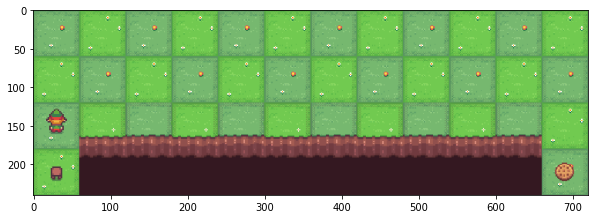

In [ ]:
# Очистка вывода для анимации
display.clear_output(wait=True)

# Параметры для создания анимации
dpi = 72
interval = 50  # ms

# Создание и отображение анимации
plt.figure(figsize=(img[0].shape[1] / dpi, img[0].shape[0] / dpi), dpi=dpi)
patch = plt.imshow(img[0])
plt.axis=('off')
animate = lambda i: patch.set_data(img[i])
ani = animation.FuncAnimation(plt.gcf(), animate, frames=len(img), interval=interval)
display.display(display.HTML(ani.to_jshtml()))

# Закрытие среды после тестирования
env.close()
